In [4]:
import pandas as pd 
pd.options.mode.chained_assignment = None  # default='warn'

In [5]:
import matplotlib.pyplot as plt 
%matplotlib inline
import seaborn as sns
import hddm 
import numpy as np
from sys import platform
import os 
# print(hddm.__version__)

%matplotlib inline
# plt.rcParams['figure.figsize'] = 30, 10
sns.set_context("notebook", font_scale=2)

/home/kbond/.conda/envs/hddm_outside_slurm/lib/python2.7/site-packages/IPython/parallel.py:13: ShimWarning: The `IPython.parallel` package has been deprecated since IPython 4.0. You should import from ipyparallel instead.
  "You should import from ipyparallel instead.", ShimWarning)


In [6]:
if platform == 'linux2':
    home = '/lab_data/coaxlab/Projects/dynamic_decision_policy_reconfiguration/'
elif platform == 'darwin': 
    home = '/Users/i_67981492/dynamic_decision_policy_reconfiguration/'
    
print(platform, home)

('linux2', '/lab_data/coaxlab/Projects/dynamic_decision_policy_reconfiguration/')


In [7]:
write_dir = os.path.join(home, 'analysis_revision/loki0.5_acc_av_models'); print(write_dir)

/lab_data/coaxlab/Projects/dynamic_decision_policy_reconfiguration/analysis_revision/loki0.5_acc_av_models


In [8]:
os.path.isdir(write_dir)

True

## Question = are other decision params plausibly associated with exploration ($z,t$, drift criterion)  sensitive to a change point?
## Is it worth the time to do this? Yes. Because see above ^ &, given our primary conclusions hinge on this, it has the highest "return on investment" of all the revisions requested.
## Plan is to use the same data reduction strategy as with circular glms: modeling trials proximal to a change point as 'conditions.'
## Reasons? 
* need to do stim coding to estimate drift criterion & z, & there are valid reasons to consider these params to be relevant, as cited by reviewers.
* stimulus coding with regression is wonky & yields weird results, even when conducting parameter recovery with simulated data.
* minimizes computational complexity of fits. 
* addresses reviewers' questions faster.

## Output:
* a distribution of estimated 'conditional' parameters for each trial
* an estimate of distribitional overlap: check if <= 2.5% of the mass of these trialwise distributions is overlapping at each edge (p < .025 for each direction).

## Interpretation: 
* If trialwise distributions of params proximal to a change point are not substantially different, then that param is not modulated by the presence of a change point. 
* We can then plausibly say that there is no evidentiary support for the contribution of these params to the CP-evoked decision trajectory. 

In [9]:
home

'/lab_data/coaxlab/Projects/dynamic_decision_policy_reconfiguration/'

In [10]:
all_obs_data_loki1 = hddm.load_csv(os.path.join(home, 'analysis_revision/ls_reward_df.csv'))
all_obs_data_loki1.head()

,cpp,b_t0,b_t1,MC,H,signed_B_diff,ideal_B,lambda_val,p_optimal,trial,...,id_choice,stim_duration,stim_onset,stim_offset,abs_response_time,epoch_length,epoch_trial,epoch_number,shifted_epoch_trial_run,shifted_epoch_trial
0,0.057115,0.000000,0.000000,0.500000,0.083333,0.000000,0.000000,10.0,0.65,0,...,102.0,1.499650,0.015908,1.515558,0.248027,8.0,0.0,0.0,0.0,0.0
1,0.997328,0.000000,0.085672,0.654212,0.083333,0.000000,-0.085672,10.0,0.65,1,...,102.0,1.500102,8.364781,9.864883,8.818569,8.0,1.0,0.0,1.0,1.0
2,0.123895,5.195541,1.496222,0.492819,0.083333,0.085672,3.699319,10.0,0.65,2,...,109.0,1.488333,16.396737,17.885070,16.835354,8.0,2.0,0.0,2.0,2.0
3,0.103157,4.737683,2.545751,0.603075,0.083333,-3.699319,2.191932,10.0,0.65,3,...,102.0,1.499503,27.078792,28.578295,27.581813,8.0,3.0,0.0,3.0,3.0
4,0.144054,4.020871,2.437875,0.648866,0.083333,-2.191932,1.582996,10.0,0.65,4,...,109.0,1.499704,37.977493,39.477197,38.420646,8.0,4.0,0.0,4.0,4.0


In [11]:
all_obs_data_loki1.p_optimal.unique()

array([0.65, 0.75, 0.85])

In [12]:
all_obs_data_loki1.lambda_val.unique()

array([10., 20., 30.])

In [13]:
all_obs_data = hddm.load_csv(os.path.join(home, 'aggregated_data/loki_0.5/av_manifold_df.csv'))
all_obs_data.drop(columns=['Unnamed: 0', 'Unnamed: 0.1', 'Unnamed: 0.1.1'], inplace=True)
all_obs_data['session_n'] = all_obs_data.reward_code.copy() 

In [14]:
all_obs_data.p_optimal.unique()

array([0.65, 0.75, 0.85])

In [15]:
all_obs_data.lambda_val.unique()

array([10., 20., 30.])

In [16]:
all_obs_data_loki1.subj_id.unique()

array([790, 811, 813, 860])

In [17]:
all_obs_data_loki1.groupby(['subj_id']).lambda_val.unique()

subj_id
790    [10.0, 20.0, 30.0]
811    [10.0, 20.0, 30.0]
813    [10.0, 20.0, 30.0]
860    [10.0, 20.0, 30.0]
Name: lambda_val, dtype: object

In [18]:
all_obs_data_loki1.groupby(['subj_id']).p_optimal.unique()

subj_id
790    [0.65, 0.75, 0.85]
811    [0.65, 0.75, 0.85]
813    [0.65, 0.75, 0.85]
860    [0.65, 0.75, 0.85]
Name: p_optimal, dtype: object

In [19]:
sorted_all_obs_data_loki1 = all_obs_data_loki1.sort_values(by=['subj_id', 'condition'])
sorted_all_obs_data = all_obs_data.sort_values(by=['subj_id', 'condition'])

In [20]:
sorted_all_obs_data_loki1.head()

,cpp,b_t0,b_t1,MC,H,signed_B_diff,ideal_B,lambda_val,p_optimal,trial,...,id_choice,stim_duration,stim_onset,stim_offset,abs_response_time,epoch_length,epoch_trial,epoch_number,shifted_epoch_trial_run,shifted_epoch_trial
0,0.057115,0.000000,0.000000,0.500000,0.083333,0.000000,0.000000,10.0,0.65,0,...,102.0,1.499650,0.015908,1.515558,0.248027,8.0,0.0,0.0,0.0,0.0
1,0.997328,0.000000,0.085672,0.654212,0.083333,0.000000,-0.085672,10.0,0.65,1,...,102.0,1.500102,8.364781,9.864883,8.818569,8.0,1.0,0.0,1.0,1.0
2,0.123895,5.195541,1.496222,0.492819,0.083333,0.085672,3.699319,10.0,0.65,2,...,109.0,1.488333,16.396737,17.885070,16.835354,8.0,2.0,0.0,2.0,2.0
3,0.103157,4.737683,2.545751,0.603075,0.083333,-3.699319,2.191932,10.0,0.65,3,...,102.0,1.499503,27.078792,28.578295,27.581813,8.0,3.0,0.0,3.0,3.0
4,0.144054,4.020871,2.437875,0.648866,0.083333,-2.191932,1.582996,10.0,0.65,4,...,109.0,1.499704,37.977493,39.477197,38.420646,8.0,4.0,0.0,4.0,4.0


In [21]:
sorted_all_obs_data.head()

,cpp,b_t0,b_t1,MC,H,signed_B_diff,ideal_B,lambda_val,p_optimal,trial,...,a_est_z,v_est_z,theta_deg_360,theta_deg_abs_180,r_z,theta_radians_z,theta_deg_z,theta_deg_360_z,theta_deg_abs_180_z,session_n
0,0.076938,1.038488,3.199304,0.383517,0.0975,0.000000,-2.160816,10.0,0.65,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
1,0.319389,1.073995,2.636439,0.604624,0.0975,2.160816,-1.562444,10.0,0.65,2,...,0.372983,-1.969731,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
2,0.300755,1.210057,1.084931,0.467104,0.0975,1.562444,0.125126,10.0,0.65,3,...,-0.833442,-1.514212,159.314616,159.314616,1.289558,2.780565,159.314616,159.314616,159.314616,0
3,0.365146,1.297258,2.998052,0.489297,0.0975,-0.125126,-1.700794,10.0,0.65,4,...,-0.740719,-0.229528,85.871786,85.871786,1.288026,1.498745,85.871786,85.871786,85.871786,0
4,0.074485,1.371289,0.931292,0.456994,0.0975,1.700794,0.439997,10.0,0.65,5,...,-1.061126,-1.619533,257.019606,102.980394,1.426455,-1.797347,-102.980394,257.019606,102.980394,0


In [22]:
loki1_loki5_df = pd.concat([sorted_all_obs_data, sorted_all_obs_data_loki1], sort=False)

In [23]:
loki1_loki5_df.head()

,cpp,b_t0,b_t1,MC,H,signed_B_diff,ideal_B,lambda_val,p_optimal,trial,...,theta_deg_360,theta_deg_abs_180,r_z,theta_radians_z,theta_deg_z,theta_deg_360_z,theta_deg_abs_180_z,session_n,run_n,shifted_epoch_trial_run
0,0.076938,1.038488,3.199304,0.383517,0.0975,0.000000,-2.160816,10.0,0.65,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN
1,0.319389,1.073995,2.636439,0.604624,0.0975,2.160816,-1.562444,10.0,0.65,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN
2,0.300755,1.210057,1.084931,0.467104,0.0975,1.562444,0.125126,10.0,0.65,3,...,159.314616,159.314616,1.289558,2.780565,159.314616,159.314616,159.314616,0.0,NaN,NaN
3,0.365146,1.297258,2.998052,0.489297,0.0975,-0.125126,-1.700794,10.0,0.65,4,...,85.871786,85.871786,1.288026,1.498745,85.871786,85.871786,85.871786,0.0,NaN,NaN
4,0.074485,1.371289,0.931292,0.456994,0.0975,1.700794,0.439997,10.0,0.65,5,...,257.019606,102.980394,1.426455,-1.797347,-102.980394,257.019606,102.980394,0.0,NaN,NaN


In [24]:
loki1_loki5_df.subj_id.unique()

array([786, 787, 788, 789, 790, 811, 813, 860])

In [25]:
reward_condition_order_df = pd.read_csv(os.path.join(home, 
                                                     'analysis_revision/reward_condition_order.csv')).drop(columns=['notes']).dropna()


In [26]:
reward_condition_order_df_melt = reward_condition_order_df.melt(id_vars=['coax_id'], var_name='session_n', value_name='reward_code')

In [27]:
reward_condition_order_df_melt['session_n'] = reward_condition_order_df_melt.session_n.str.split('reward_code_session_', expand=True)[1]

In [28]:
reward_condition_order_df_melt[['session_n', 'reward_code', 'coax_id']] = reward_condition_order_df_melt[['session_n', 'reward_code', 'coax_id']].astype(int)

In [29]:
reward_condition_order_df_melt.head()

,coax_id,session_n,reward_code
0,785,1,7
1,786,1,8
2,787,1,3
3,788,1,2
4,789,1,7


In [30]:
loki1_loki5_all_obs_data_pared = loki1_loki5_df.loc[(loki1_loki5_df.shifted_epoch_trial <= 3) &
                                      (loki1_loki5_df.shifted_epoch_trial >=-1)]

In [32]:
loki1_loki5_all_obs_data_pared.subj_id.unique()

array([786, 787, 788, 789, 790, 811, 813, 860])

In [33]:
sorted_all_obs_data.shifted_epoch_trial.unique()

array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8., -1.,  0.])

In [34]:
sorted_all_obs_data_loki1.shifted_epoch_trial.unique()

array([ 0.,  1.,  2.,  3.,  4., -3., -2., -1.,  5.,  6.,  7.,  8.,  9.,
       10., 11., 12., 13., 14., 15., 16., 17., 18., 19., 20., 21., 22.,
       23., 24., 25., 26., 27., 28., 29., 30., 31., 32., 33., 34., 35.,
       36., 37., 38., 39., 40., 41., 42.])

In [35]:
loki1_loki5_df.shifted_epoch_trial.unique()

array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8., -1.,  0., -3., -2.,  9.,
       10., 11., 12., 13., 14., 15., 16., 17., 18., 19., 20., 21., 22.,
       23., 24., 25., 26., 27., 28., 29., 30., 31., 32., 33., 34., 35.,
       36., 37., 38., 39., 40., 41., 42.])

In [36]:
loki1_loki5_all_obs_data_pared.shifted_epoch_trial.unique()

array([ 1.,  2.,  3., -1.,  0.])

In [37]:
loki1_loki5_all_obs_data_pared.groupby('condition').p_optimal.unique()

condition
6510    [0.65]
6520    [0.65]
6530    [0.65]
7510    [0.75]
7520    [0.75]
7530    [0.75]
8510    [0.85]
8520    [0.85]
8530    [0.85]
Name: p_optimal, dtype: object

In [38]:
loki1_loki5_all_obs_data_pared.groupby('condition').lambda_val.unique()

condition
6510    [10.0]
6520    [20.0]
6530    [30.0]
7510    [10.0]
7520    [20.0]
7530    [30.0]
8510    [10.0]
8520    [20.0]
8530    [30.0]
Name: lambda_val, dtype: object

In [39]:
loki1_loki5_all_obs_data_pared.columns = loki1_loki5_all_obs_data_pared.columns.str.strip()
loki1_loki5_all_obs_data_pared.head()

,cpp,b_t0,b_t1,MC,H,signed_B_diff,ideal_B,lambda_val,p_optimal,trial,...,theta_deg_360,theta_deg_abs_180,r_z,theta_radians_z,theta_deg_z,theta_deg_360_z,theta_deg_abs_180_z,session_n,run_n,shifted_epoch_trial_run
0,0.076938,1.038488,3.199304,0.383517,0.0975,0.000000,-2.160816,10.0,0.65,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN
1,0.319389,1.073995,2.636439,0.604624,0.0975,2.160816,-1.562444,10.0,0.65,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN
2,0.300755,1.210057,1.084931,0.467104,0.0975,1.562444,0.125126,10.0,0.65,3,...,159.314616,159.314616,1.289558,2.780565,159.314616,159.314616,159.314616,0.0,NaN,NaN
8,0.077553,3.117083,0.910612,0.388958,0.0975,-0.849840,2.206471,10.0,0.65,13,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN
9,0.463273,2.991672,0.326721,0.605994,0.0975,-2.206471,-2.664951,10.0,0.65,14,...,27.811620,27.811620,2.213519,0.485404,27.811620,27.811620,27.811620,0.0,NaN,NaN


Text(0,0.5,'accuracy')

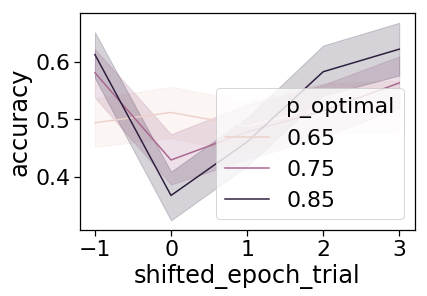

In [40]:
plt.figure()
sns.lineplot(x="shifted_epoch_trial",y="p_accuracy", data=loki1_loki5_all_obs_data_pared,
             ci=95, n_boot=1000,
           hue='p_optimal', legend="full")
plt.ylabel('accuracy')

Text(0,0.5,'accuracy')

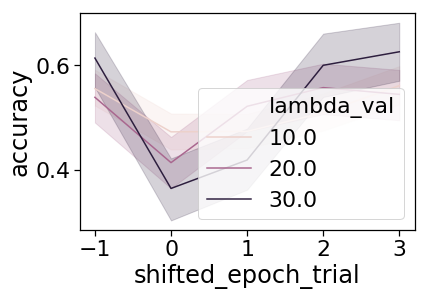

In [41]:
plt.figure()
sns.lineplot(x="shifted_epoch_trial",y="p_accuracy", data=loki1_loki5_all_obs_data_pared,
             ci=95, n_boot=1000,
           hue='lambda_val',legend="full")
plt.ylabel('accuracy')

Text(0,0.5,'\\DeltaB')

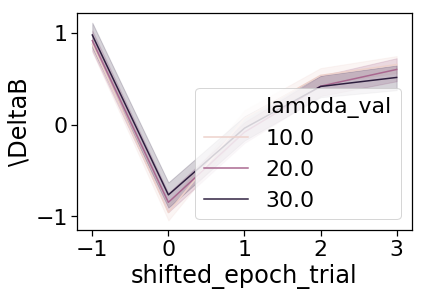

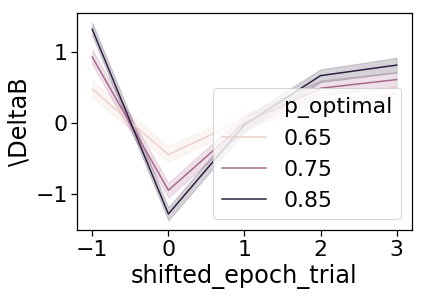

In [42]:
plt.figure()
sns.lineplot(x="shifted_epoch_trial",y="ideal_B", data=loki1_loki5_all_obs_data_pared,
             ci=95, n_boot=1000,
           hue='lambda_val',legend="full")

plt.ylabel('\DeltaB')

plt.figure()
sns.lineplot(x="shifted_epoch_trial",y="ideal_B", data=loki1_loki5_all_obs_data_pared,
             ci=95, n_boot=1000,
           hue='p_optimal',legend="full")
plt.ylabel('\DeltaB')


Text(0,0.5,'CPP')

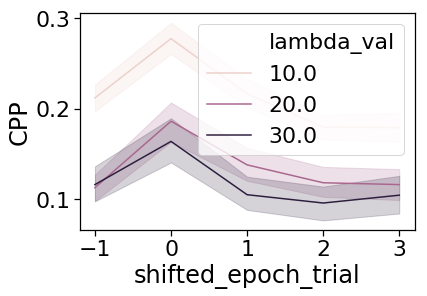

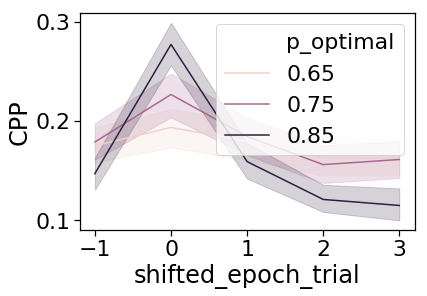

In [43]:
plt.figure()
sns.lineplot(x="shifted_epoch_trial",y="cpp", data=loki1_loki5_all_obs_data_pared,
             ci=95, n_boot=1000,
           hue='lambda_val',legend="full")
plt.ylabel('CPP')

plt.figure()
sns.lineplot(x="shifted_epoch_trial",y="cpp", data=loki1_loki5_all_obs_data_pared,
             ci=95, n_boot=1000,
           hue='p_optimal',legend="full")
plt.ylabel('CPP')

In [44]:
# all_obs_data_pared.loc[all_obs_data_pared.id_choice == 111, 'id_choice'] = 0
# all_obs_data_pared.loc[all_obs_data_pared.id_choice == 112, 'id_choice'] = 1

# all_obs_data_pared.loc[all_obs_data_pared.high_p_cue == 111, 'p_id_solution'] = 0
# all_obs_data_pared.loc[all_obs_data_pared.high_p_cue == 112, 'p_id_solution'] = 1

In [115]:
loki1_loki5_all_obs_data_pared[["shifted_epoch_trial"]] = loki1_loki5_all_obs_data_pared[["shifted_epoch_trial"]].astype('category')

loki1_loki5_all_obs_data_pared = loki1_loki5_all_obs_data_pared.rename(index=str, columns={"p_accuracy": "response", 
                                                        "subj_id": "subj_idx"})
all_obs_data_pared_input = loki1_loki5_all_obs_data_pared[['response', 'rt', 
                                                   'condition',
                             'subj_idx', 'shifted_epoch_trial', 'p_optimal', 'lambda_val', 'cpp', 'ideal_B', 'trial']].dropna()

In [116]:
all_obs_data_pared_input.to_csv(os.path.join(write_dir, 'loki_0.5_1_beh_data.csv'), index=False)

In [117]:
all_obs_data_pared_input.head()

,response,rt,condition,subj_idx,shifted_epoch_trial,p_optimal,lambda_val,cpp,ideal_B,trial
0,1.0,0.474282,6510,786,1.0,0.65,10.0,0.076938,-2.160816,1
1,1.0,0.500100,6510,786,2.0,0.65,10.0,0.319389,-1.562444,2
2,1.0,0.534169,6510,786,3.0,0.65,10.0,0.300755,0.125126,3
8,1.0,0.630004,6510,786,-1.0,0.65,10.0,0.077553,2.206471,13
9,1.0,0.596382,6510,786,0.0,0.65,10.0,0.463273,-2.664951,14


In [67]:
all_obs_data_pared_input.subj_idx.unique()

array([786, 787, 788, 789, 790, 811, 813, 860])

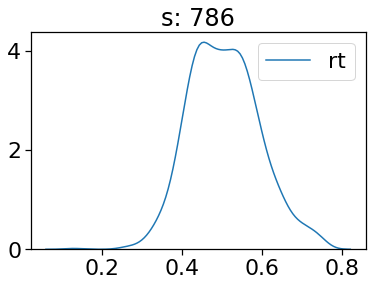

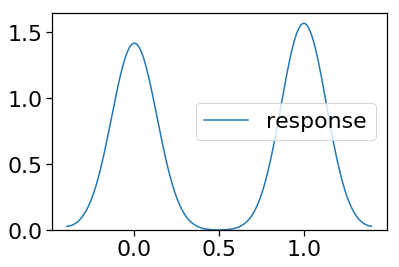

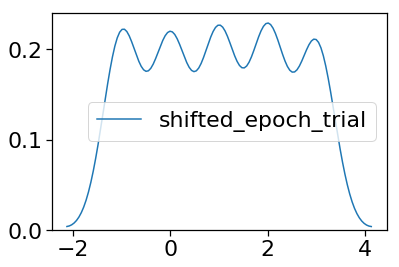

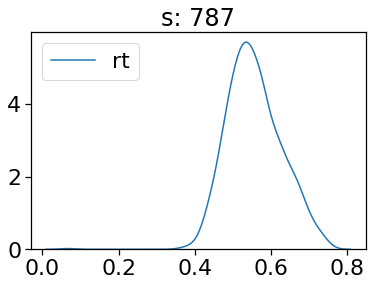

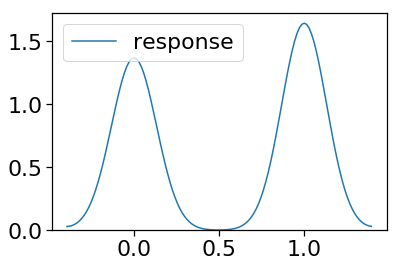

...

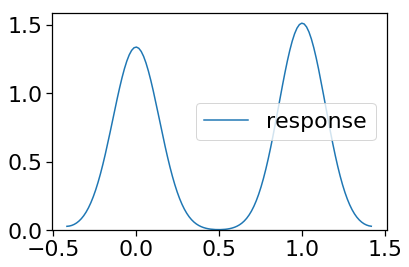

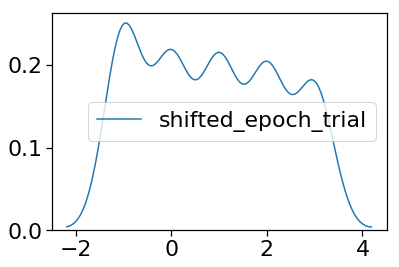

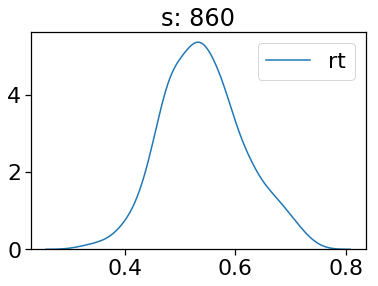

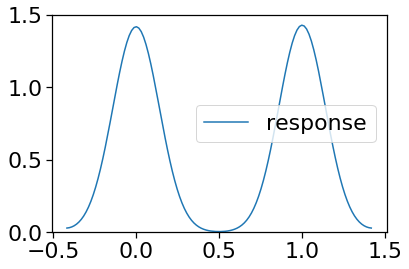

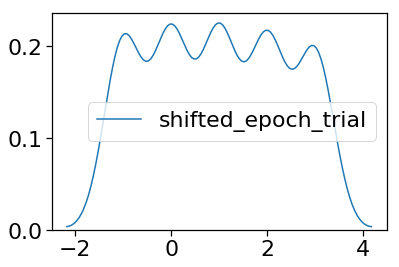

In [69]:
for s in all_obs_data_pared_input.subj_idx.unique():

    data = all_obs_data_pared_input.loc[all_obs_data_pared_input.subj_idx == s].copy()
    sns.kdeplot(data.rt)
    plt.title('s: {}'.format(s))
    plt.show()
    
    
    sns.kdeplot(data.response)
    plt.show()
    
    sns.kdeplot(data.shifted_epoch_trial)
    plt.show()

In [70]:
loki1_loki5_all_obs_data_pared.shifted_epoch_trial.isna().sum()

0

In [71]:
print(all_obs_data_pared_input.isna().sum())

response               0
rt                     0
condition              0
subj_idx               0
shifted_epoch_trial    0
p_optimal              0
lambda_val             0
dtype: int64


In [72]:
included_params_input = ['a', 'v', 't', 'z']
# included_params_input = ['a', 'v', 't']

n_samples, n_burned_samples, n_thin = 10000, 5000, 1
p_outlier = 0.05
# n_samples, n_burned_samples, n_thin = 100, 5, 1 # min. samples to test the workflow

In [73]:
models = []

In [77]:
all_obs_data_pared_input.subj_idx.unique()

array([786, 787, 788, 789, 790, 811, 813, 860])

## acc coded estimates

In [75]:
null_m = hddm.HDDM(all_obs_data_pared_input, 
              include=included_params_input, 
                        is_group_model=True, 
                        p_outlier=p_outlier, 
                        trace_subjs=True, 
                        informative=True)
null_m.find_starting_values()
null_m.sample(n_samples, burn=n_burned_samples, thin=n_thin)

 [-----------------100%-----------------] 10000 of 10000 complete in 1887.3 sec

In [81]:
[m.depends_on for m in models ]

[{'a': ['shifted_epoch_trial']},
 {'v': ['shifted_epoch_trial']},
 {'t': ['shifted_epoch_trial']}]

In [ ]:
# depends_on = {'a': ['shifted_epoch_trial', 'session_n'], 'v': ['shifted_epoch_trial', 'session_n']}

models = []


for p in included_params_input:


    depends_on = {p: ['shifted_epoch_trial']}

    m = hddm.HDDM(all_obs_data_pared_input, 
                            depends_on=depends_on, 
                  include=included_params_input, 
                            is_group_model=True, 
                            p_outlier=p_outlier, 
                            trace_subjs=True, 
                            informative=True) 
    print('k...defined model')
    m.find_starting_values()
    print('k...found sv')
    m.sample(n_samples, burn=n_burned_samples, thin=n_thin)
    print('sampling done')
    
    models.append(m)


k...defined model
k...found sv
 [-----------------100%-----------------] 10000 of 10000 complete in 2396.8 secsampling done
k...defined model
k...found sv
 [-----------------100%-----------------] 10000 of 10000 complete in 2371.7 secsampling done
k...defined model
k...found sv
 [-----------------75%--------          ] 7502 of 10000 complete in 1838.7 sec

In [83]:
[m.depends_on for m in models]

[{'a': ['shifted_epoch_trial']},
 {'v': ['shifted_epoch_trial']},
 {'t': ['shifted_epoch_trial']},
 {'z': ['shifted_epoch_trial']}]

Plotting a(-1.0)
Plotting a(0.0)
Plotting a(1.0)
Plotting a(2.0)
Plotting a(3.0)
Plotting a_std
Plotting v
Plotting v_std
Plotting t
Plotting t_std
Plotting z
Plotting z_std
Plotting a
Plotting a_std
Plotting v(-1.0)
Plotting v(0.0)
Plotting v(1.0)
Plotting v(2.0)
Plotting v(3.0)
Plotting v_std
Plotting t


/home/kbond/.conda/envs/hddm_outside_slurm/lib/python2.7/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Plotting t_std
Plotting z
Plotting z_std
Plotting a
Plotting a_std
Plotting v
Plotting v_std
Plotting t(-1.0)
Plotting t(0.0)
Plotting t(1.0)
Plotting t(2.0)
Plotting t(3.0)
Plotting t_std
Plotting z
Plotting z_std
Plotting a
Plotting a_std
Plotting v
Plotting v_std
Plotting t
Plotting t_std
Plotting z(-1.0)
Plotting z(0.0)
Plotting z(1.0)
Plotting z(2.0)
Plotting z(3.0)
Plotting z_std


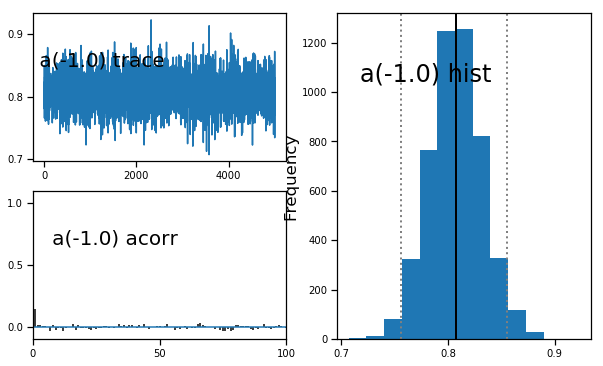

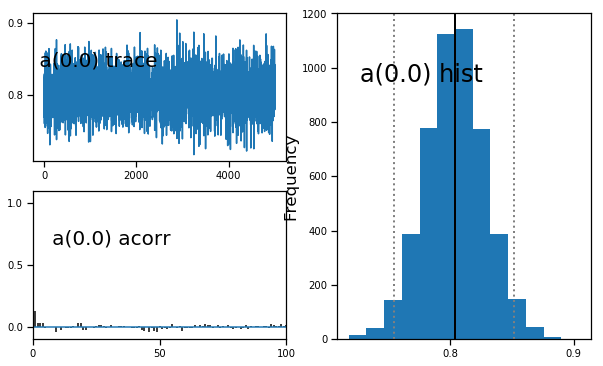

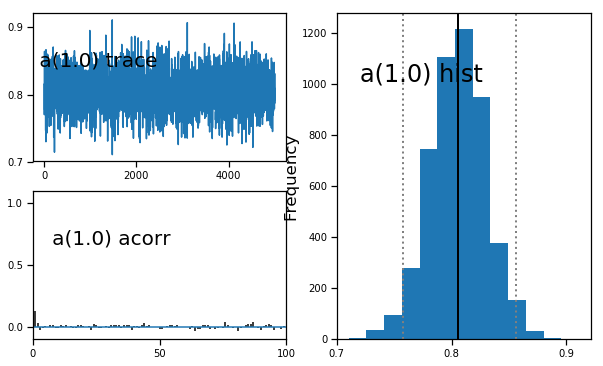

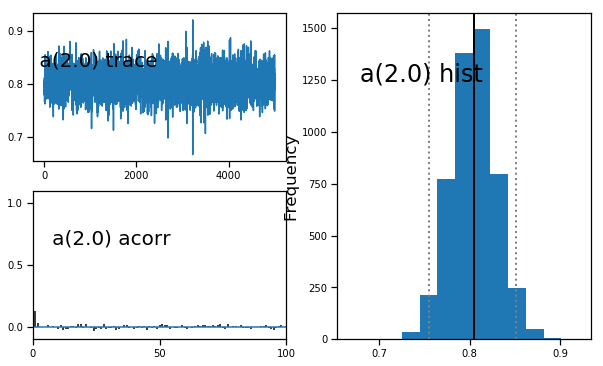

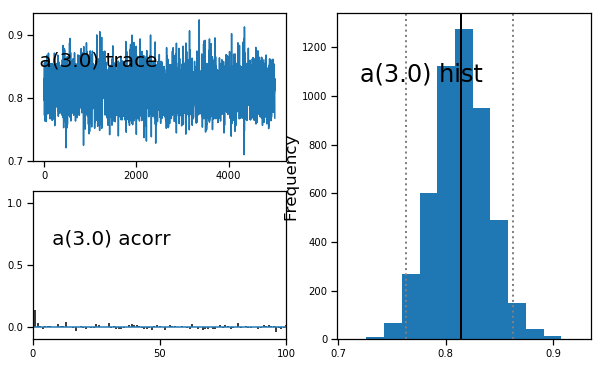

...

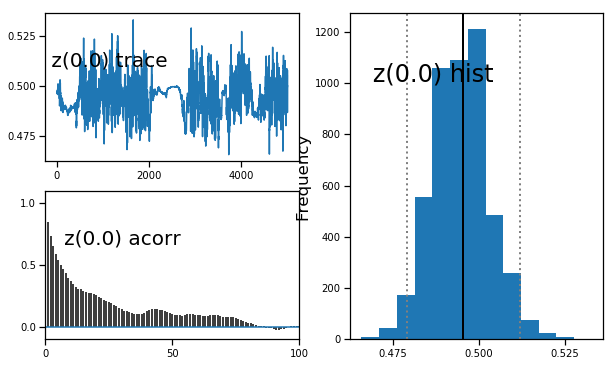

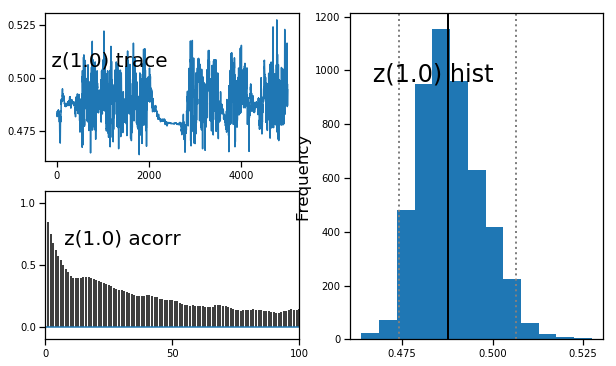

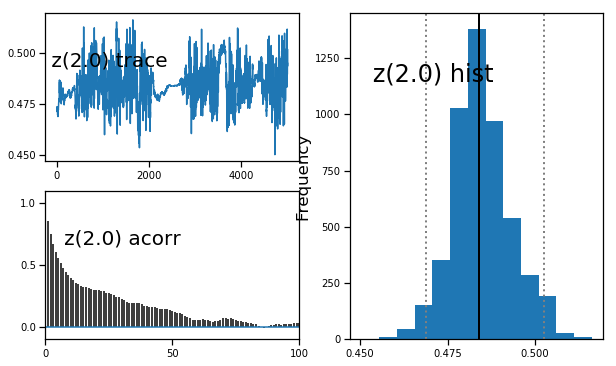

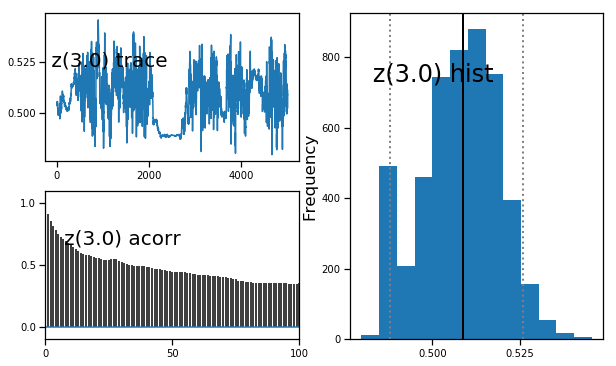

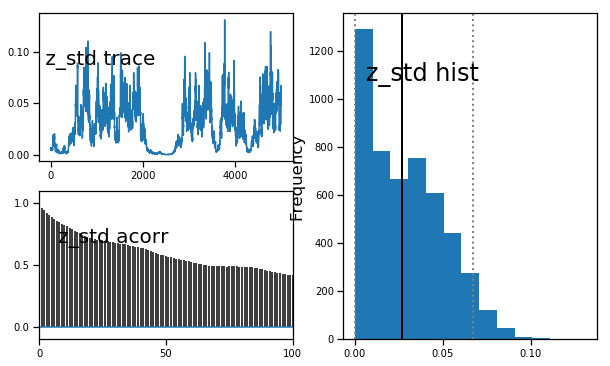

In [84]:
for m in models:
    m.plot_posteriors()

In [89]:
# models.append(null_m)

In [88]:
for m in models:
    print(m.depends_on, m.dic_info)

({'a': ['shifted_epoch_trial']}, {'deviance': -2189.5453262288356, 'pD': 51.527725210136396, 'DIC': -2138.017601018699})
({'v': ['shifted_epoch_trial']}, {'deviance': -2296.0531717407307, 'pD': 40.32343443098853, 'DIC': -2255.729737309742})
({'t': ['shifted_epoch_trial']}, {'deviance': -2393.9795290800525, 'pD': 43.49500810609197, 'DIC': -2350.4845209739606})
({'z': ['shifted_epoch_trial']}, {'deviance': -2203.9211807039223, 'pD': 30.833022270023775, 'DIC': -2173.0881584338986})
(None, {'deviance': -2200.3545757341985, 'pD': 24.83758547896332, 'DIC': -2175.516990255235})


In [90]:
a_model, v_model = models[0], models[1]

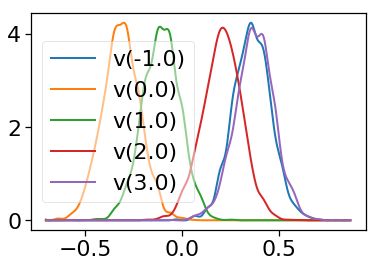

In [91]:
v_model.plot_posteriors_conditions()

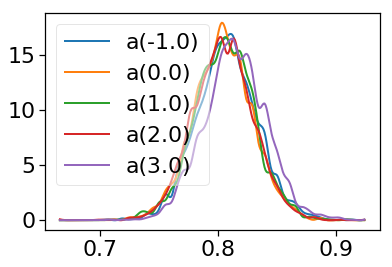

In [92]:
a_model.plot_posteriors_conditions()

In [63]:
test_a_traces = both_m.get_traces()[[u'a(1)', u'a(2)', u'a(3)', u'a(4)', u'a(5)', u'a(6)', u'a(7)', u'a(8)',
       u'a(9)']]
test_v_traces = both_m.get_traces()[[u'v(1)', u'v(2)', u'v(3)', u'v(4)', u'v(5)', u'v(6)', u'v(7)', u'v(8)',
       u'v(9)']]

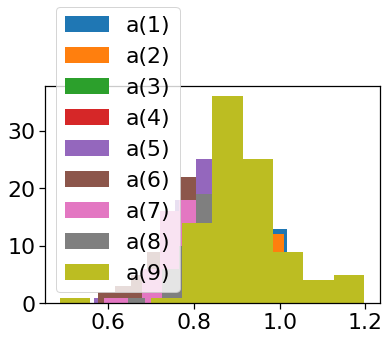

In [64]:
plt.figure()
for col in test_a_traces.columns:
    plt.hist(test_a_traces[col], label=col)
    plt.legend()

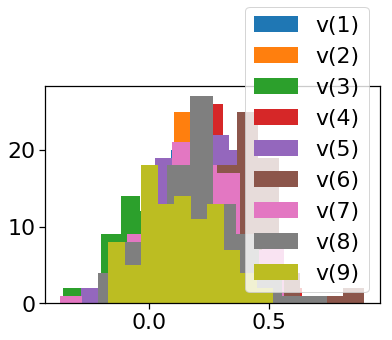

In [66]:
for col in test_v_traces.columns:
    plt.hist(test_v_traces[col], label=col)
    plt.legend()

In [30]:
models.append(both_m)

In [ ]:
# get sub-level traces 

In [115]:
depends_on = {'a': 'shifted_epoch_trial'}
print(depends_on)

m = hddm.HDDM(all_obs_data_pared, 
                        depends_on=depends_on, 
              include=included_params_input, 
                        is_group_model=True, 
                        p_outlier=p_outlier, 
                        trace_subjs=True, 
                        informative=True,
                        group_only_nodes = included_params_input) 
m.find_starting_values()
m.sample(n_samples, burn=n_burned_samples, thin=n_thin)

m.append(m)

{'a': 'shifted_epoch_trial'}
 [-----------------100%-----------------] 10001 of 10000 complete in 1918.9 sec

In [116]:
depends_on = {'v': 'shifted_epoch_trial'}
print(depends_on)

m = hddm.HDDM(all_obs_data_pared, 
                        depends_on=depends_on, 
              include=included_params_input, 
                        is_group_model=True, 
                        p_outlier=p_outlier, 
                        trace_subjs=True, 
                        informative=True,
                        group_only_nodes = included_params_input) 
m.find_starting_values()
m.sample(n_samples, burn=n_burned_samples, thin=n_thin)

models.append(m)

{'v': 'shifted_epoch_trial'}
 [-----------------100%-----------------] 10000 of 10000 complete in 1936.4 sec

In [117]:
print(models, null_m)

([<hddm.models.hddm_info.HDDM object at 0x7f6b0e6cb7d0>, <hddm.models.hddm_info.HDDM object at 0x7f6b0e83eb50>, <hddm.models.hddm_info.HDDM object at 0x7f6b0e926f10>, <hddm.models.hddm_info.HDDM object at 0x7f6b0dc41850>, <hddm.models.hddm_info.HDDM object at 0x7f6b0eb0f590>, <hddm.models.hddm_info.HDDM object at 0x7f6b0dd28950>], <hddm.models.hddm_info.HDDM object at 0x7f6b247ec490>)


In [118]:
all_models = models + [null_m]

# Convergence!

Plotting a(0.0.0.65)
Plotting a(0.0.0.75)
Plotting a(0.0.0.85)
Plotting a(1.0.0.65)
Plotting a(1.0.0.75)
Plotting a(1.0.0.85)
Plotting a(2.0.0.65)
Plotting a(2.0.0.75)
Plotting a(2.0.0.85)
Plotting a(3.0.0.65)
Plotting a(3.0.0.75)
Plotting a(3.0.0.85)
Plotting a(4.0.0.65)
Plotting a(4.0.0.75)
Plotting a(4.0.0.85)
Plotting a(5.0.0.65)
Plotting a(5.0.0.75)
Plotting a(5.0.0.85)
Plotting a(6.0.0.65)
Plotting a(6.0.0.75)
Plotting a(6.0.0.85)
Plotting a(7.0.0.65)
Plotting a(7.0.0.75)
Plotting a(7.0.0.85)
Plotting a(8.0.0.65)
Plotting a(8.0.0.75)
Plotting a(8.0.0.85)
Plotting a(9.0.0.65)
Plotting a(9.0.0.75)
Plotting a(9.0.0.85)
Plotting a(10.0.0.65)
Plotting a(10.0.0.75)
Plotting a(10.0.0.85)
Plotting a(11.0.0.65)
Plotting a(11.0.0.75)
Plotting a(11.0.0.85)
Plotting a(12.0.0.65)
Plotting a(12.0.0.75)
Plotting a(12.0.0.85)
Plotting a(13.0.0.65)
Plotting a(13.0.0.75)
Plotting a(13.0.0.85)
Plotting a(14.0.0.65)
Plotting a(14.0.0.75)
Plotting a(14.0.0.85)
Plotting a(15.0.0.65)
Plotting a(15.0.0.

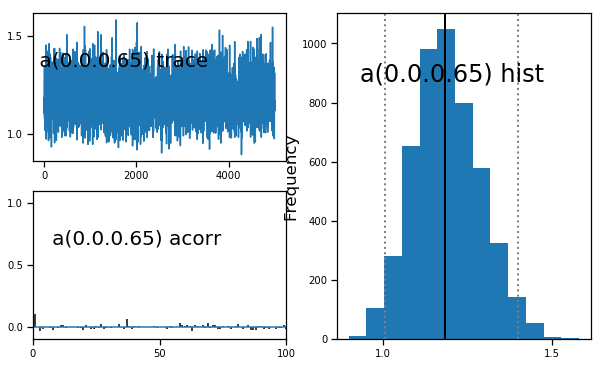

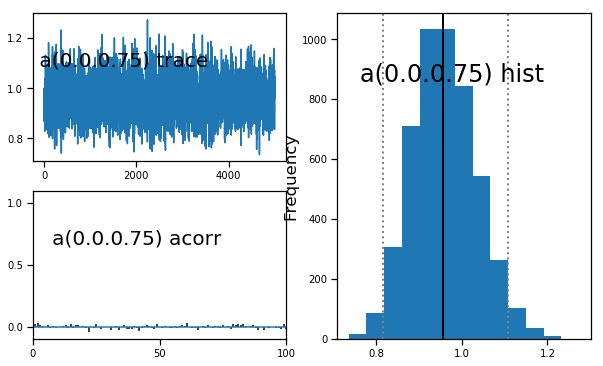

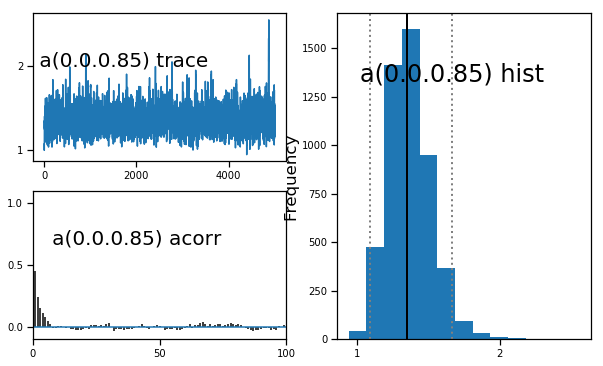

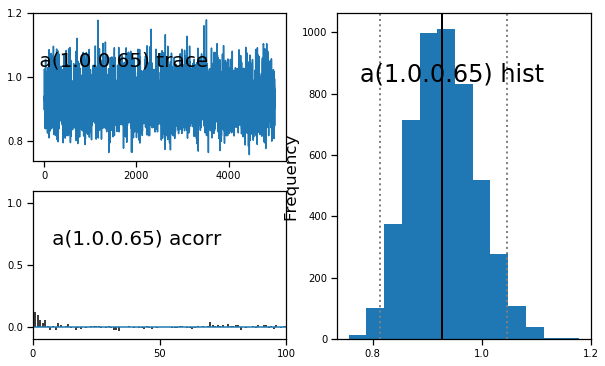

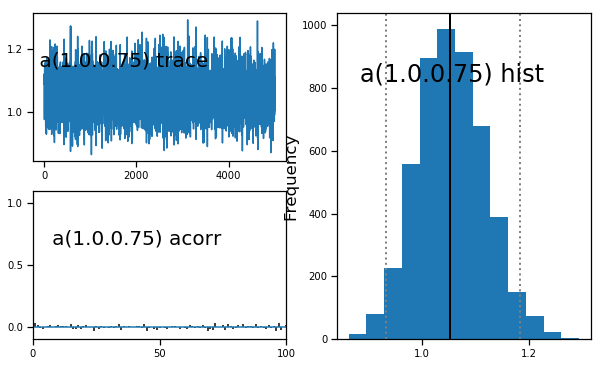

...

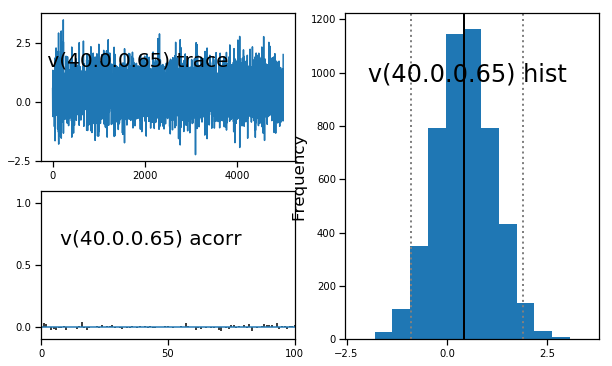

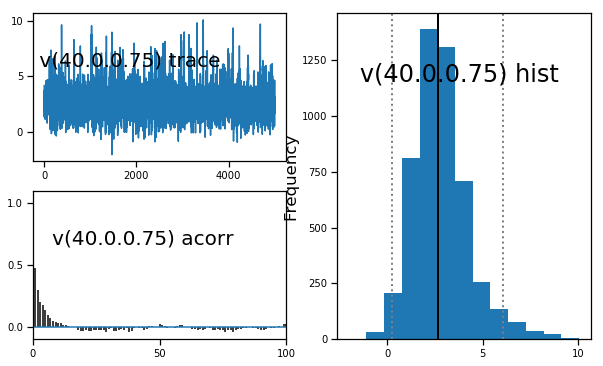

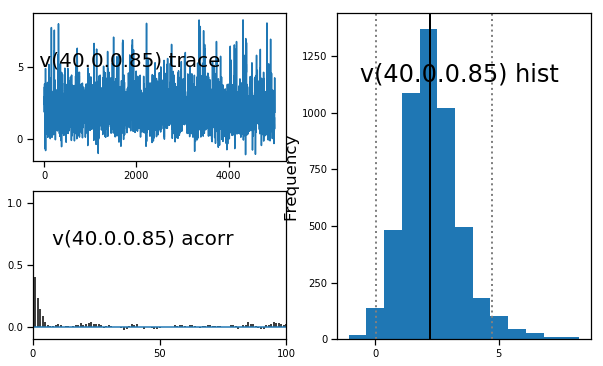

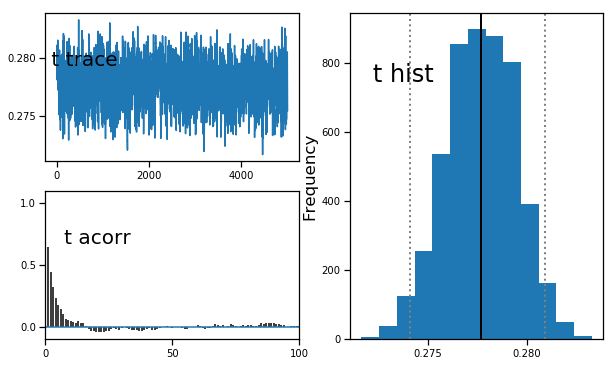

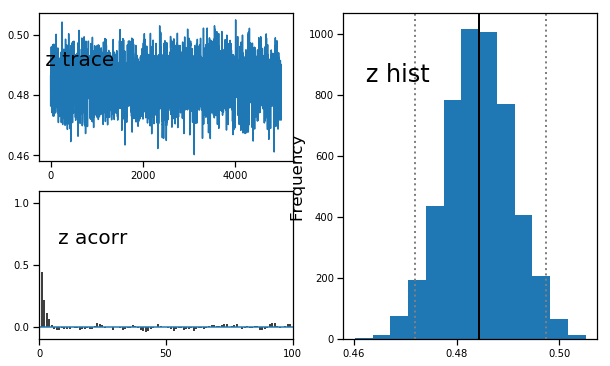

In [31]:
both_m.plot_posteriors()

In [74]:
# for m in all_models:
#     m.plot_posteriors()

### create DIC df

In [120]:
model_dic_list = []

null_dic_dict = {'model': 'null'}
null_dic_dict.update(null_m.dic_info) 

model_dic_list.append(null_dic_dict)

for m in models: # alternatives

    depends_on_var = m.depends_on.values()[0][0]
    ddm_param = m.depends_on.keys()[0]
        
    temp_dict = {'model': ddm_param + '_' + depends_on_var}
    temp_dict.update(m.dic_info)
    
    temp_dict['null_adj_DIC'] = null_dic_dict['DIC'] - temp_dict['DIC']
    
    model_dic_list.append(temp_dict)

In [121]:
model_dic_list

[{'DIC': 1151.6524478258843,
  'deviance': 1148.624973446851,
  'model': 'null',
  'pD': 3.027474379033265},
 {'DIC': 1158.001170574645,
  'deviance': 1151.0559845850348,
  'model': 'a_shifted_epoch_trial',
  'null_adj_DIC': -6.348722748760565,
  'pD': 6.945185989610081},
 {'DIC': 1077.2755689876465,
  'deviance': 1070.2568547359872,
  'model': 'v_shifted_epoch_trial',
  'null_adj_DIC': 74.37687883823787,
  'pD': 7.018714251659276},
 {'DIC': 1158.229770936613,
  'deviance': 1151.1554012516624,
  'model': 'a_shifted_epoch_trial',
  'null_adj_DIC': -6.577323110728685,
  'pD': 7.074369684950625},
 {'DIC': 1077.2044296516715,
  'deviance': 1070.2269860075799,
  'model': 'v_shifted_epoch_trial',
  'null_adj_DIC': 74.44801817421285,
  'pD': 6.977443644091636},
 {'DIC': 1158.0606185723923,
  'deviance': 1151.0657293038364,
  'model': 'a_shifted_epoch_trial',
  'null_adj_DIC': -6.408170746507949,
  'pD': 6.99488926855588},
 {'DIC': 1077.3832664863537,
  'deviance': 1070.3198730361737,
  'model

In [122]:
dic_df = pd.DataFrame(model_dic_list)
dic_df

,DIC,deviance,model,null_adj_DIC,pD
0,1151.652448,1148.624973,null,NaN,3.027474
1,1158.001171,1151.055985,a_shifted_epoch_trial,-6.348723,6.945186
2,1077.275569,1070.256855,v_shifted_epoch_trial,74.376879,7.018714
3,1158.229771,1151.155401,a_shifted_epoch_trial,-6.577323,7.074370
4,1077.204430,1070.226986,v_shifted_epoch_trial,74.448018,6.977444
5,1158.060619,1151.065729,a_shifted_epoch_trial,-6.408171,6.994889
6,1077.383266,1070.319873,v_shifted_epoch_trial,74.269181,7.063393


In [123]:
dic_df.to_csv(os.path.join(home, write_dir, 'av_dic_df.csv'), index=False)

### create trace df

In [70]:
both_m.get_group_traces()[:5]

,a(0.0.1.0),a(0.0.2.0),a(0.0.3.0),a(1.0.-1.0),a(1.0.0.0),a(1.0.1.0),a(1.0.2.0),a(1.0.3.0),a(10.0.-1.0),a(10.0.0.0),...,v(8.0.0.0),v(8.0.1.0),v(8.0.2.0),v(8.0.3.0),v(9.0.-1.0),v(9.0.0.0),v(9.0.1.0),v(9.0.2.0),v(9.0.3.0),z_trans
0,1.125586,1.250234,0.977480,1.043785,1.030979,0.812318,1.158643,1.126472,0.940715,0.966971,...,-0.378328,-0.884393,0.404698,0.161938,1.449442,-0.522783,-0.317468,-0.196157,1.065732,-0.095407
1,1.295251,1.122123,1.026984,1.063282,1.045746,0.798977,1.099294,1.134675,0.975312,0.924147,...,-0.405177,-0.902789,-0.592303,0.393211,1.211280,-0.462643,-0.122712,-0.036193,1.241465,-0.054123
2,0.992305,1.090414,1.032957,1.060257,1.049403,0.753991,0.930989,0.987647,0.919918,0.930684,...,-0.625744,-0.541328,-0.424879,0.497032,0.784690,-0.278876,0.139696,0.936104,1.276336,-0.032825
3,1.255506,1.206729,0.977066,0.962371,1.093627,0.985958,1.013538,1.058040,0.938749,0.901918,...,-0.749263,-0.737507,-0.468061,-0.006318,1.548986,-0.626339,0.047436,-0.027326,0.056404,-0.043888
4,1.266966,1.190188,1.033000,0.918693,1.182633,0.848999,1.044991,1.025496,1.000673,0.973983,...,0.485646,-0.809726,-0.252189,-0.567315,0.962058,-0.749563,0.347291,0.498219,1.209981,-0.055015


In [125]:
# null_stim_m.get_group_traces().head()


In [126]:
# null_stim_m_traces = null_stim_m.get_traces()

In [127]:
# null_stim_m_traces.head()

In [128]:
# make sure null is in models 

In [129]:
all_models

In [130]:
all_models[:2]

In [34]:
group_trace_dfs = []
sub_trace_dfs = []

In [35]:
# for m in all_models[:2]:
m  = both_m
all_traces = m.get_traces()
group_traces = m.get_group_traces()

# identify the model 
depends_on_var = m.depends_on.values()[1][0]
ddm_param = m.depends_on.keys()[1]

#     # sub traces
#     sub_trace_cols = [col for col in all_traces.columns if 'dc_subj' in col]
#     sub_traces = all_traces[sub_trace_cols]

#     sub_traces['mcmc_iteration'] = np.arange(len(sub_trace_cols))
#     sub_only_traces = sub_traces.drop(columns='dc_std') # check if this var is included

#     sub_only_traces_melted = pd.melt(sub_only_traces, var_name='shifted_epoch_trial', value_name=ddm_param, id_vars='mcmc_iteration')
#     sub_only_traces_melted['shifted_epoch_trial'] = sub_only_traces_melted.epoch_trial.str.split('(\d+)', expand=True)[1]
#     sub_only_traces_melted['model'] = (ddm_param + '_' + depends_on_var)
#     sub_only_traces_melted['ddm_param'] = ddm_param

#     sub_trace_dfs.append(sub_only_traces_melted)

# group traces
group_trace_cols = [col for col in group_traces.columns if 'a(' in col]
group_only_traces = group_traces[group_trace_cols]

group_only_traces['mcmc_iteration'] = np.arange(len(group_traces))
#     group_only_traces = group_traces.drop(columns= ddm_param + '_std')

group_only_traces_melted = pd.melt(group_only_traces, var_name='epoch_window_number', value_name='a', id_vars='mcmc_iteration')
group_only_traces_melted['epoch_window_number'] = group_only_traces_melted.epoch_window_number.str.split('(', expand=True)[1].str.split(')', expand=True)[0]


group_only_traces_melted['model'] = ('av')
group_only_traces_melted['ddm_param'] = 'a'
group_only_traces_melted.head()

# group_only_traces_melted.to_csv(os.path.join(home, write_dir, 
#                                              'v' + '_' + 'v' 
#                                              + '_traces.csv'), index=False)

group_trace_dfs.append(group_only_traces_melted)

In [36]:
len(group_trace_dfs)

1

# Plot CP-evoked distributions of params for all models

### subject traces

In [132]:
# for trace_df in sub_trace_dfs:

#     ddm_param = trace_df.ddm_param.unique()

    
#     sns.set_context("notebook", font_scale=1.7)
#     sns.set_style('white')
#     sns.despine()

#     g = sns.FacetGrid(sub_only_traces_melted, col='subj_id', hue="epoch_trial", 
#                       palette="Set1", size=5, aspect=3)
#     g = (g.map(sns.distplot, decision_param, hist=True, rug=False))
#     g.add_legend()
#     g._legend.set_title('Trials after change point')
#     plt.xlabel('{} estimate'.format(decision_param))
#     plt.ylabel('density')

### group traces

In [94]:
group_traces = a_model.get_group_traces()

# group traces
a_group_trace_cols = [col for col in group_traces.columns if 'a' in col]
a_group_only_traces = group_traces[a_group_trace_cols]

group_traces = v_model.get_group_traces()

# group traces
v_group_trace_cols = [col for col in group_traces.columns if 'v' in col]
v_group_only_traces = group_traces[v_group_trace_cols]




In [95]:
v_group_only_traces.drop(columns='v_std', inplace=True)

In [96]:
a_group_only_traces.drop(columns=['a_std', 'z_trans'], inplace=True)

In [97]:
a_group_only_traces.head()

,a(-1.0),a(0.0),a(1.0),a(2.0),a(3.0)
0,0.790786,0.798680,0.815186,0.804149,0.830426
1,0.780769,0.807291,0.813636,0.786675,0.829555
2,0.783516,0.825017,0.779887,0.778639,0.796125
3,0.838515,0.787498,0.769954,0.804987,0.819003
4,0.849841,0.760695,0.815585,0.806299,0.813610


In [98]:
v_group_only_traces.head()

,v(-1.0),v(0.0),v(1.0),v(2.0),v(3.0)
0,0.076575,-0.201363,-0.163659,0.272994,0.409705
1,0.140463,-0.463966,-0.184100,0.334902,0.396487
2,0.285089,-0.317159,-0.092536,0.166822,0.333861
3,0.257359,-0.226731,-0.155041,0.308474,0.381810
4,0.363526,-0.339619,-0.255776,0.137700,0.341088


In [8]:
v_traces = pd.read_csv(os.path.join(write_dir, 'single_param_model_traces', 'av_model_v_traces.csv'))
a_traces = pd.read_csv(os.path.join(write_dir, 'single_param_model_traces', 'av_model_a_traces.csv'))

In [99]:
group_trace_dfs = [a_group_only_traces, v_group_only_traces]

In [92]:
trace_df.head()

,mcmc_iteration,epoch_window_number,a,model,ddm_param
0,0,0.0,1.143871,av,a
1,1,0.0,1.165195,av,a
2,2,0.0,1.149874,av,a
3,3,0.0,1.102685,av,a
4,4,0.0,1.146267,av,a


In [39]:
epoch_number_order = np.arange(0,40).astype('str')

In [100]:
a_group_only_traces_melted = a_group_only_traces.melt()

a_group_only_traces_melted['epoch_trial_n'] = a_group_only_traces_melted.variable.str.split('(', expand=True)[1].str.split(')', expand=True)[0]
a_group_only_traces_melted.drop(columns='variable', inplace=True)
a_group_only_traces_melted.columns = ['a', 'epoch_trial_n']
a_group_only_traces_melted.head()

,a,epoch_trial_n
0,0.790786,-1.0
1,0.780769,-1.0
2,0.783516,-1.0
3,0.838515,-1.0
4,0.849841,-1.0


In [101]:
v_group_only_traces_melted = v_group_only_traces.melt()

v_group_only_traces_melted['epoch_trial_n'] = v_group_only_traces_melted.variable.str.split('(', expand=True)[1].str.split(')', expand=True)[0]
v_group_only_traces_melted.drop(columns='variable', inplace=True)
v_group_only_traces_melted.columns = ['v', 'epoch_trial_n']
v_group_only_traces_melted.head()

,v,epoch_trial_n
0,0.076575,-1.0
1,0.140463,-1.0
2,0.285089,-1.0
3,0.257359,-1.0
4,0.363526,-1.0


In [105]:
v_model.data.subj_idx.unique() == a_model.data.subj_idx.unique()

array([ True,  True,  True,  True,  True,  True,  True,  True])

<Figure size 432x288 with 0 Axes>

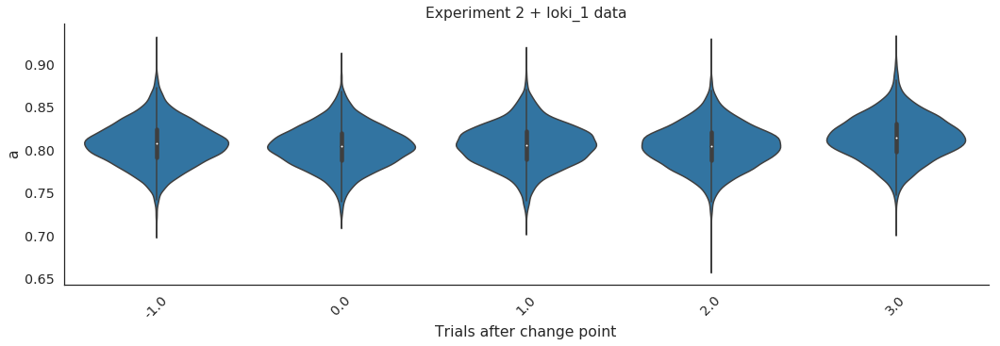

In [109]:
sns.set_context("notebook", font_scale=1.3)
sns.set_style('white')
sns.despine()
g = sns.FacetGrid(a_group_only_traces_melted, 
                  palette="Set1", size=5, aspect=3)

g = (g.map(sns.violinplot, "epoch_trial_n", 'a', split=True))
plt.xticks(rotation=45)

plt.xlabel('Trials after change point')
plt.title('Experiment 2 + loki_1 data')
plt.show()
g.savefig(os.path.join(home, write_dir, 'a' + '_cp_evoked_distributions_loki0.5_1.png'))

<Figure size 432x288 with 0 Axes>

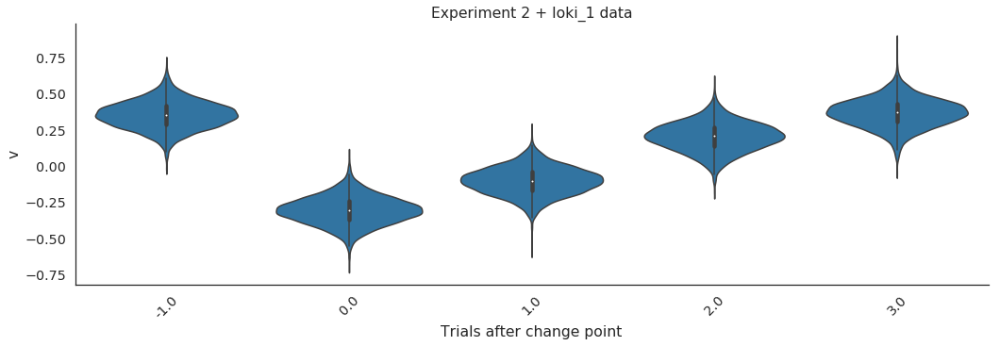

In [110]:
sns.set_context("notebook", font_scale=1.3)
sns.set_style('white')
sns.despine()
g = sns.FacetGrid(v_group_only_traces_melted, 
                  palette="Set1", size=5, aspect=3)

g = (g.map(sns.violinplot, "epoch_trial_n", 'v', split=True,
         ))
plt.xticks(rotation=45)

plt.xlabel('Trials after change point')
plt.title('Experiment 2 + loki_1 data')
plt.show()
g.savefig(os.path.join(home, write_dir, 'v' + '_cp_evoked_distributions_loki0.5_1.png'))